In [134]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.defaule = 'colab'

from itables import show

# This stops a few warning messages from showing
pd.options.mode.chained_assignment = None 
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [135]:
# Load the data.
file_name = 'flights'
file_location = 'https://joannabieri.com/introdatascience/data/'+file_name+'.csv'
DF = pd.read_csv(file_location)
DF

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400.0,5.0,15.0,2013-01-01 10:00:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416.0,5.0,29.0,2013-01-01 10:00:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089.0,5.0,40.0,2013-01-01 10:00:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576.0,5.0,45.0,2013-01-01 10:00:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762.0,6.0,0.0,2013-01-01 11:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336771,2013,9,30,NaN,1455,NaN,NaN,1634,NaN,9E,3393,NaN,JFK,DCA,NaN,213.0,14.0,55.0,2013-09-30 18:00:00
336772,2013,9,30,NaN,2200,NaN,NaN,2312,NaN,9E,3525,NaN,LGA,SYR,NaN,198.0,22.0,0.0,2013-10-01 02:00:00
336773,2013,9,30,NaN,1210,NaN,NaN,1330,NaN,MQ,3461,N535MQ,LGA,BNA,NaN,764.0,12.0,10.0,2013-09-30 16:00:00
336774,2013,9,30,NaN,1159,NaN,NaN,1344,NaN,MQ,3572,N511MQ,LGA,CLE,NaN,419.0,11.0,59.0,2013-09-30 15:00:00


In [136]:
# Preliminaries
DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 336776 entries, 0 to 336775
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   year            336776 non-null  int64  
 1   month           336776 non-null  int64  
 2   day             336776 non-null  int64  
 3   dep_time        328521 non-null  float64
 4   sched_dep_time  336776 non-null  int64  
 5   dep_delay       328521 non-null  float64
 6   arr_time        328063 non-null  float64
 7   sched_arr_time  336776 non-null  int64  
 8   arr_delay       327346 non-null  float64
 9   carrier         336776 non-null  object 
 10  flight          336776 non-null  int64  
 11  tailnum         334264 non-null  object 
 12  origin          336776 non-null  object 
 13  dest            336776 non-null  object 
 14  air_time        327346 non-null  float64
 15  distance        336776 non-null  float64
 16  hour            336776 non-null  float64
 17  minute    

In [137]:
DF.describe()

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,flight,air_time,distance,hour,minute
count,336776.0,336776.000000,336776.000000,328521.000000,336776.000000,328521.000000,328063.000000,336776.000000,327346.000000,336776.000000,327346.000000,336776.000000,336776.000000,336776.000000
mean,2013.0,6.548510,15.710787,1349.109947,1344.254840,12.639070,1502.054999,1536.380220,6.895377,1971.923620,150.686460,1039.912604,13.180247,26.230100
std,0.0,3.414457,8.768607,488.281791,467.335756,40.210061,533.264132,497.457142,44.633292,1632.471938,93.688305,733.233033,4.661316,19.300846
min,2013.0,1.000000,1.000000,1.000000,106.000000,-43.000000,1.000000,1.000000,-86.000000,1.000000,20.000000,17.000000,1.000000,0.000000
25%,2013.0,4.000000,8.000000,907.000000,906.000000,-5.000000,1104.000000,1124.000000,-17.000000,553.000000,82.000000,502.000000,9.000000,8.000000
50%,2013.0,7.000000,16.000000,1401.000000,1359.000000,-2.000000,1535.000000,1556.000000,-5.000000,1496.000000,129.000000,872.000000,13.000000,29.000000
75%,2013.0,10.000000,23.000000,1744.000000,1729.000000,11.000000,1940.000000,1945.000000,14.000000,3465.000000,192.000000,1389.000000,17.000000,44.000000
max,2013.0,12.000000,31.000000,2400.000000,2359.000000,1301.000000,2400.000000,2359.000000,1272.000000,8500.000000,695.000000,4983.000000,23.000000,59.000000


In [138]:
DF.isna().sum()

year                 0
month                0
day                  0
dep_time          8255
sched_dep_time       0
dep_delay         8255
arr_time          8713
sched_arr_time       0
arr_delay         9430
carrier              0
flight               0
tailnum           2512
origin               0
dest                 0
air_time          9430
distance             0
hour                 0
minute               0
time_hour            0
dtype: int64

In [139]:
# 336,776 observations and 19 variables.
# dep_delay and arr_delay both have higher std than the mean, implying
# high variability in those columns.

In [140]:
# 1 ten most common destinations for flights from NYC airports in 2013
DF_dest = DF['dest'].value_counts().head(10)
DF_dest

dest
ORD    17283
ATL    17215
LAX    16174
BOS    15508
MCO    14082
CLT    14064
SFO    13331
FLL    12055
MIA    11728
DCA     9705
Name: count, dtype: int64

1

the ten most common destinations for flights from NYC airports in 2013 were ORD, ATL, LAX, BOS, MCO, CLT, SFO, FLL, MIA, and DCA.  

In [241]:
# 2 airlines with the most flights departing from NYC airports in 2013?
DF[DF['origin'].isin(['EWR','LGA','JFK'])]['carrier'].value_counts().head(10)

carrier
UA    58665
B6    54635
EV    54173
DL    48110
AA    32729
MQ    26397
US    20536
9E    18460
WN    12275
VX     5162
Name: count, dtype: int64

2

United Airlines, JetBlue Airways, and ExpressJet Airlines have the most flights departing from NYC in 2013

In [242]:
# 3 mask the NaNs
DF['arr_delay'] = DF['arr_delay'].apply(lambda x: str(x).replace('nan','NA') )
DF['arr_delay'].value_counts()

arr_delay
-13.0     7494
-10.0     7275
-14.0     7163
-12.0     7115
-11.0     6994
          ... 
516.0        1
931.0        1
616.0        1
560.0        1
1007.0       1
Name: count, Length: 577, dtype: int64

In [243]:
mask = DF['arr_delay'].apply(lambda x:'NaN' not in str(x) )
DF_no_nan = DF[mask]
DF_no_nan

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400.0,5.0,15.0,2013-01-01 10:00:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416.0,5.0,29.0,2013-01-01 10:00:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089.0,5.0,40.0,2013-01-01 10:00:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576.0,5.0,45.0,2013-01-01 10:00:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762.0,6.0,0.0,2013-01-01 11:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336771,2013,9,30,NaN,1455,NaN,NaN,1634,-25.0,9E,3393,NaN,JFK,DCA,NaN,213.0,14.0,55.0,2013-09-30 18:00:00
336772,2013,9,30,NaN,2200,NaN,NaN,2312,-25.0,9E,3525,NaN,LGA,SYR,NaN,198.0,22.0,0.0,2013-10-01 02:00:00
336773,2013,9,30,NaN,1210,NaN,NaN,1330,-25.0,MQ,3461,N535MQ,LGA,BNA,NaN,764.0,12.0,10.0,2013-09-30 16:00:00
336774,2013,9,30,NaN,1159,NaN,NaN,1344,-25.0,MQ,3572,N511MQ,LGA,CLE,NaN,419.0,11.0,59.0,2013-09-30 15:00:00


In [144]:
my_cols=['arr_delay','carrier']
DF.groupby(by=['carrier'])[my_cols].describe()

arr_delay                     carrier                  
            count unique    top  freq   count unique top   freq
carrier                                                        
9E          18460    376     NA  1166   18460      1  9E  18460
AA          32729    382     NA   782   32729      1  AA  32729
AS            714    145  -18.0    19     714      1  AS    714
B6          54635    408  -10.0  1305   54635      1  B6  54635
DL          48110    460  -14.0  1082   48110      1  DL  48110
EV          54173    431     NA  3065   54173      1  EV  54173
F9            685    170    0.0    18     685      1  F9    685
FL           3260    268     NA    85    3260      1  FL   3260
HA            342    105  -19.0    10     342      1  HA    342
MQ          26397    350     NA  1360   26397      1  MQ  26397
OO             32     23     NA     3      32      1  OO     32
UA          58665    438  -14.0  1244   58665      1  UA  58665
US          20536    316     NA   705   20536      1  US  20536
VX           5162    306  -18.0   113    5162      1  VX   5162
WN          12275    353  -12.0   266   12275      1  WN  12275
YV            601    152     NA    57     601      1  YV    601

In [145]:
DF2=DF.ffill()
DF2

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400.0,5.0,15.0,2013-01-01 10:00:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416.0,5.0,29.0,2013-01-01 10:00:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089.0,5.0,40.0,2013-01-01 10:00:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576.0,5.0,45.0,2013-01-01 10:00:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762.0,6.0,0.0,2013-01-01 11:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336771,2013,9,30,2349.0,1455,-10.0,325.0,1634,NA,9E,3393,N740EV,JFK,DCA,196.0,213.0,14.0,55.0,2013-09-30 18:00:00
336772,2013,9,30,2349.0,2200,-10.0,325.0,2312,NA,9E,3525,N740EV,LGA,SYR,196.0,198.0,22.0,0.0,2013-10-01 02:00:00
336773,2013,9,30,2349.0,1210,-10.0,325.0,1330,NA,MQ,3461,N535MQ,LGA,BNA,196.0,764.0,12.0,10.0,2013-09-30 16:00:00
336774,2013,9,30,2349.0,1159,-10.0,325.0,1344,NA,MQ,3572,N511MQ,LGA,CLE,196.0,419.0,11.0,59.0,2013-09-30 15:00:00


In [150]:
DF['arr_delay'].dtype

dtype('O')

In [151]:
DF['arr_delay'] = DF['arr_delay'].replace('NA')
DF['arr_delay'] = DF['arr_delay'].astype(float)

In [152]:
DF['arr_delay'].dtype

dtype('float64')

In [153]:
carrier_delay = DF.groupby('carrier')['arr_delay'].mean()
carrier_delay

carrier
9E    12.612080
AA     1.654710
AS    -9.812325
B6    10.175162
DL     2.112638
EV    19.635741
F9    22.252555
FL    21.677301
HA    -6.915205
MQ    14.355533
OO    21.562500
UA     4.447592
US     4.712602
VX     2.161372
WN    10.475682
YV    23.778702
Name: arr_delay, dtype: float64

In [154]:
carrier_delay.max()

23.778702163061563

In [155]:
carrier_delay.min()

-9.81232492997199

3 a. Carrier F9 had the highest mean arrival delay of +23.78 minutes

  b. Carrier AS had the lowest mean arrival delay of -9.81 minutes

In [208]:
# 4 a. breaking the day into four time intervals
mask = (DF['dep_time'] >= 0) & (DF['dep_time'] <= 600)
DF_12am_6am= DF[mask]
mask = (DF['dep_time'] >= 601) & (DF['dep_time'] <= 1200)
DF_601am_12pm = DF[mask]
mask = (DF['dep_time'] >= 1201) & (DF['dep_time'] <= 1800)
DF_1201pm_6pm = DF[mask]
mask = (DF['dep_time'] >= 1801) & (DF['dep_time'] <= 2359)
DF_601pm_1159pm = DF[mask]

In [198]:
DF_12am_6am

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400.0,5.0,15.0,2013-01-01 10:00:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416.0,5.0,29.0,2013-01-01 10:00:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089.0,5.0,40.0,2013-01-01 10:00:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576.0,5.0,45.0,2013-01-01 10:00:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762.0,6.0,0.0,2013-01-01 11:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
335802,2013,9,30,557.0,600,-3.0,852.0,923,-31.0,UA,303,N510UA,JFK,SFO,326.0,2586.0,6.0,0.0,2013-09-30 10:00:00
335803,2013,9,30,558.0,600,-2.0,815.0,829,-14.0,EV,4137,N16981,EWR,ATL,107.0,746.0,6.0,0.0,2013-09-30 10:00:00
335804,2013,9,30,558.0,600,-2.0,742.0,749,-7.0,DL,731,N337NB,LGA,DTW,83.0,502.0,6.0,0.0,2013-09-30 10:00:00
335805,2013,9,30,559.0,600,-1.0,NaN,715,-7.0,WN,464,N411WN,EWR,MDW,NaN,711.0,6.0,0.0,2013-09-30 10:00:00


In [201]:
prop_delayed = DF_12am_6am.groupby('dep_time')['dep_delay'].apply(lambda x: (x > 0).mean()).sort_index()
prop_delayed

dep_time
1.0      1.000000
2.0      1.000000
3.0      1.000000
4.0      1.000000
5.0      1.000000
           ...   
556.0    0.008557
557.0    0.006258
558.0    0.001443
559.0    0.004777
600.0    0.009772
Name: dep_delay, Length: 238, dtype: float64

In [202]:
DF_601am_12pm

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
19,2013,1,1,601.0,600,1.0,844.0,850,-6.0,B6,343,N644JB,EWR,PBI,147.0,1023.0,6.0,0.0,2013-01-01 11:00:00
20,2013,1,1,602.0,610,-8.0,812.0,820,-8.0,DL,1919,N971DL,LGA,MSP,170.0,1020.0,6.0,10.0,2013-01-01 11:00:00
21,2013,1,1,602.0,605,-3.0,821.0,805,16.0,MQ,4401,N730MQ,LGA,DTW,105.0,502.0,6.0,5.0,2013-01-01 11:00:00
22,2013,1,1,606.0,610,-4.0,858.0,910,-12.0,AA,1895,N633AA,EWR,MIA,152.0,1085.0,6.0,10.0,2013-01-01 11:00:00
23,2013,1,1,606.0,610,-4.0,837.0,845,-8.0,DL,1743,N3739P,JFK,ATL,128.0,760.0,6.0,10.0,2013-01-01 11:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336179,2013,9,30,1157.0,1159,-2.0,1445.0,1453,-8.0,B6,323,N766JB,JFK,LAX,306.0,2475.0,11.0,59.0,2013-09-30 15:00:00
336180,2013,9,30,1157.0,1200,-3.0,1543.0,1515,28.0,UA,766,N595UA,JFK,SFO,314.0,2586.0,12.0,0.0,2013-09-30 16:00:00
336181,2013,9,30,1158.0,1200,-2.0,1313.0,1317,-4.0,US,2179,N747UW,LGA,DCA,41.0,214.0,12.0,0.0,2013-09-30 16:00:00
336182,2013,9,30,1159.0,1200,-1.0,1306.0,1315,-9.0,WN,3330,N920WN,EWR,MDW,100.0,711.0,12.0,0.0,2013-09-30 16:00:00


In [203]:
prop_delayed_2 = DF_601am_12pm.groupby('dep_time')['dep_delay'].apply(lambda x: (x > 0).mean()).sort_index()
prop_delayed_2

dep_time
601.0     0.515544
602.0     0.388889
603.0     0.329870
604.0     0.274566
605.0     0.253230
            ...   
1156.0    0.140171
1157.0    0.152381
1158.0    0.151261
1159.0    0.159091
1200.0    0.205955
Name: dep_delay, Length: 360, dtype: float64

In [204]:
DF_1201pm_6pm

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
306,2013,1,1,1202.0,1207,-5.0,1318.0,1314,4.0,EV,4347,N11536,EWR,BTV,51.0,266.0,12.0,7.0,2013-01-01 17:00:00
307,2013,1,1,1202.0,1159,3.0,1645.0,1653,-8.0,UA,1663,N38403,EWR,SJU,187.0,1608.0,11.0,59.0,2013-01-01 16:00:00
308,2013,1,1,1203.0,1205,-2.0,1501.0,1437,24.0,EV,3850,N13978,EWR,ATL,142.0,746.0,12.0,5.0,2013-01-01 17:00:00
309,2013,1,1,1203.0,1200,3.0,1519.0,1545,-26.0,VX,25,N843VA,JFK,SFO,353.0,2586.0,12.0,0.0,2013-01-01 17:00:00
310,2013,1,1,1204.0,1200,4.0,1500.0,1448,12.0,B6,523,N612JB,EWR,MCO,139.0,937.0,12.0,0.0,2013-01-01 17:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336552,2013,9,30,1758.0,1803,-5.0,2038.0,2056,-18.0,UA,360,N576UA,EWR,PBI,132.0,1023.0,18.0,3.0,2013-09-30 22:00:00
336553,2013,9,30,1758.0,1759,-1.0,2031.0,2102,-31.0,UA,535,N502UA,JFK,LAX,298.0,2475.0,17.0,59.0,2013-09-30 21:00:00
336554,2013,9,30,1759.0,1730,29.0,1925.0,1915,10.0,WN,19,N766SW,EWR,STL,117.0,872.0,17.0,30.0,2013-09-30 21:00:00
336555,2013,9,30,1759.0,1755,4.0,1917.0,1934,-17.0,UA,691,N833UA,LGA,ORD,105.0,733.0,17.0,55.0,2013-09-30 21:00:00


In [205]:
prop_delayed_3 = DF_1201pm_6pm.groupby('dep_time')['dep_delay'].apply(lambda x: (x > 0).mean()).sort_index()
prop_delayed_3

dep_time
1201.0    0.536667
1202.0    0.498195
1203.0    0.470588
1204.0    0.474903
1205.0    0.389262
            ...   
1756.0    0.453089
1757.0    0.406977
1758.0    0.353081
1759.0    0.407692
1800.0    0.450000
Name: dep_delay, Length: 360, dtype: float64

In [206]:
DF_601pm_1159pm

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
636,2013,1,1,1802.0,1805,-3.0,1930.0,1944,-14.0,DL,1006,N359NB,LGA,BUF,61.0,292.0,18.0,5.0,2013-01-01 23:00:00
637,2013,1,1,1802.0,1801,1.0,2125.0,2137,-12.0,UA,1165,N75429,EWR,LAX,340.0,2454.0,18.0,1.0,2013-01-01 23:00:00
638,2013,1,1,1803.0,1726,37.0,2011.0,1934,37.0,EV,4382,N13958,EWR,DTW,104.0,488.0,17.0,26.0,2013-01-01 22:00:00
639,2013,1,1,1803.0,1620,103.0,2008.0,1750,138.0,MQ,4622,N504MQ,LGA,BNA,154.0,764.0,16.0,20.0,2013-01-01 21:00:00
640,2013,1,1,1803.0,1800,3.0,2021.0,2001,20.0,US,373,N510UW,JFK,CLT,100.0,541.0,18.0,0.0,2013-01-01 23:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336765,2013,9,30,2240.0,2245,-5.0,2334.0,2351,-17.0,B6,1816,N354JB,JFK,SYR,41.0,209.0,22.0,45.0,2013-10-01 02:00:00
336766,2013,9,30,2240.0,2250,-10.0,2347.0,7,-20.0,B6,2002,N281JB,JFK,BUF,52.0,301.0,22.0,50.0,2013-10-01 02:00:00
336767,2013,9,30,2241.0,2246,-5.0,2345.0,1,-16.0,B6,486,N346JB,JFK,ROC,47.0,264.0,22.0,46.0,2013-10-01 02:00:00
336768,2013,9,30,2307.0,2255,12.0,2359.0,2358,1.0,B6,718,N565JB,JFK,BOS,33.0,187.0,22.0,55.0,2013-10-01 02:00:00


In [207]:
prop_delayed_4 = DF_601pm_1159pm.groupby('dep_time')['dep_delay'].apply(lambda x: (x > 0).mean()).sort_index()
prop_delayed_4

dep_time
1801.0    0.717241
1802.0    0.691131
1803.0    0.631757
1804.0    0.632353
1805.0    0.612378
            ...   
2355.0    0.231707
2356.0    0.297297
2357.0    0.297297
2358.0    0.223684
2359.0    0.309091
Name: dep_delay, Length: 359, dtype: float64

4

a. As the day goes on the likelyhood of your flight getting delayed because when you have the first flight of the day, you are not waiting on any planes to be prepared. By the end of the day, there are many factors like turbulance from the previous/current flight, machine mishaps, broken parts, etc.

prop_delayed: 0-0.10%, prop_delayed_2: 52-21%, prop_delayed_3: 54-45%, prop_delayed_4: 72-31%

In [159]:
# 5
DF['air_time'].dtype

dtype('float64')

In [160]:
flight_air = DF2[['flight','air_time','dest','tailnum']]
flight_air.groupby(by='flight').max().sort_values('air_time',ascending=False)

,air_time,dest,tailnum
flight,,,
15,695.0,SFO,N834JB
51,691.0,MDW,N958WN
721,653.0,SFO,N998AT
841,490.0,SFO,N723TW
426,440.0,ORD,N854UA
...,...,...,...
3858,31.0,PHL,N8972E
6041,30.0,ALB,N26545
3986,30.0,PHL,N8913A


In [161]:
flight_air['air_time'].max()

695.0

In [162]:
file_name = 'planes'
file_location = 'https://joannabieri.com/introdatascience/data/'+file_name+'.csv'
DF3 = pd.read_csv(file_location)
flight_air_DF3 = pd.merge(flight_air, DF3, on='tailnum',how='left')
flight_air_DF3

,flight,air_time,dest,tailnum,year,type,manufacturer,model,engines,seats,speed,engine
0,1545,227.0,IAH,N14228,1999.0,Fixed wing multi engine,BOEING,737-824,2.0,149.0,NaN,Turbo-fan
1,1714,227.0,IAH,N24211,1998.0,Fixed wing multi engine,BOEING,737-824,2.0,149.0,NaN,Turbo-fan
2,1141,160.0,MIA,N619AA,1990.0,Fixed wing multi engine,BOEING,757-223,2.0,178.0,NaN,Turbo-fan
3,725,183.0,BQN,N804JB,2012.0,Fixed wing multi engine,AIRBUS,A320-232,2.0,200.0,NaN,Turbo-fan
4,461,116.0,ATL,N668DN,1991.0,Fixed wing multi engine,BOEING,757-232,2.0,178.0,NaN,Turbo-fan
...,...,...,...,...,...,...,...,...,...,...,...,...
336771,3393,196.0,DCA,N740EV,2004.0,Fixed wing multi engine,BOMBARDIER INC,CL-600-2C10,2.0,80.0,NaN,Turbo-fan
336772,3525,196.0,SYR,N740EV,2004.0,Fixed wing multi engine,BOMBARDIER INC,CL-600-2C10,2.0,80.0,NaN,Turbo-fan
336773,3461,196.0,BNA,N535MQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
336774,3572,196.0,CLE,N511MQ,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [166]:
flight_air_DF3 = flight_air_DF3[['flight','air_time','dest','tailnum','seats']]
flight_air_DF3.groupby(by='flight').max().sort_values('air_time',ascending=False)

,air_time,dest,tailnum,seats
flight,,,,
15,695.0,SFO,N834JB,379.0
51,691.0,MDW,N958WN,377.0
721,653.0,SFO,N998AT,379.0
841,490.0,SFO,N723TW,182.0
426,440.0,ORD,N854UA,330.0
...,...,...,...,...
3858,31.0,PHL,N8972E,55.0
6041,30.0,ALB,N26545,55.0
3986,30.0,PHL,N8913A,55.0


5 a. Flight 15 was 695 minutes long.

  b. The city is SFO.
  
  c. The plane has 379 seats

In [179]:
# 6
file_name = 'airports'
file_location = 'https://joannabieri.com/introdatascience/data/'+file_name+'.csv'
DF_airports = pd.read_csv(file_location)
DF_airports

,faa,name,lat,lon,alt,tz,dst,tzone
0,04G,Lansdowne Airport,41.130472,-80.619583,1044.0,-5.0,A,America/New_York
1,06A,Moton Field Municipal Airport,32.460572,-85.680028,264.0,-6.0,A,America/Chicago
2,06C,Schaumburg Regional,41.989341,-88.101243,801.0,-6.0,A,America/Chicago
3,06N,Randall Airport,41.431912,-74.391561,523.0,-5.0,A,America/New_York
4,09J,Jekyll Island Airport,31.074472,-81.427778,11.0,-5.0,A,America/New_York
...,...,...,...,...,...,...,...,...
1453,ZUN,Black Rock,35.083228,-108.791778,6454.0,-7.0,A,America/Denver
1454,ZVE,New Haven Rail Station,41.298669,-72.925992,7.0,-5.0,A,America/New_York
1455,ZWI,Wilmington Amtrak Station,39.736667,-75.551667,0.0,-5.0,A,America/New_York
1456,ZWU,Washington Union Station,38.897460,-77.006430,76.0,-5.0,A,America/New_York


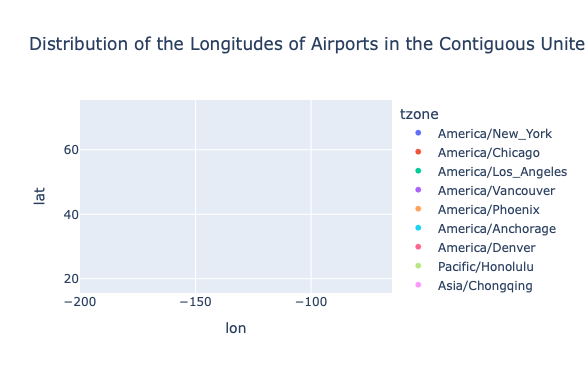

In [176]:
fig = px.scatter(DF_airports,
                 x='lon',
                 y='lat',
                 title='Distribution of the Longitudes of Airports in the Contiguous United States.',
                 hover_data='name',
                 range_x=[-200, -65],
                 color='tzone'               

                )
fig.show()

In [178]:
DF_airports['tzone'].value_counts().head(3)

tzone
America/New_York     519
America/Chicago      342
America/Anchorage    239
Name: count, dtype: int64

6

From my scatter plot, I would say they are clustered the most on the east coast and the middle otherwise has very few (North Dekota, South Dekota, Idaho, Nevada, etc.). The geographical distribution of these airports show lots of cities along water is common for transportation. The top three highest population of airport by time zones are America/New_York (519), America/Chicago (342), and America/Anchorage (239).

The 13 colonies (east coast) are the most developed and mature parts of the US, underscoring more trade routes to places like the UK and Europe, rather than to Asia. Shipping based on previously established hubs of where goods are bought and sold and where people live, eventually expanded to flying.

The America/Chicago time zone is 2nd most important to transportation because of where commerce throughout the country is centralized like Chicago, Great Lakes, Texas, and Mississippi River. Over history, commerce and trade relied on ships. People settled around those areas and became cities. 

America/Anchorage area, although the least developed/populated, it is more for natural resources, like fishing, crab, etc. than population.

In [180]:
# 7
DF2

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400.0,5.0,15.0,2013-01-01 10:00:00
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416.0,5.0,29.0,2013-01-01 10:00:00
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089.0,5.0,40.0,2013-01-01 10:00:00
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576.0,5.0,45.0,2013-01-01 10:00:00
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762.0,6.0,0.0,2013-01-01 11:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336771,2013,9,30,2349.0,1455,-10.0,325.0,1634,NA,9E,3393,N740EV,JFK,DCA,196.0,213.0,14.0,55.0,2013-09-30 18:00:00
336772,2013,9,30,2349.0,2200,-10.0,325.0,2312,NA,9E,3525,N740EV,LGA,SYR,196.0,198.0,22.0,0.0,2013-10-01 02:00:00
336773,2013,9,30,2349.0,1210,-10.0,325.0,1330,NA,MQ,3461,N535MQ,LGA,BNA,196.0,764.0,12.0,10.0,2013-09-30 16:00:00
336774,2013,9,30,2349.0,1159,-10.0,325.0,1344,NA,MQ,3572,N511MQ,LGA,CLE,196.0,419.0,11.0,59.0,2013-09-30 15:00:00


In [187]:
DF2['arr_delay'] = DF2['arr_delay']
DF2['arrival'] = DF2['arr_delay'].apply(lambda x: 'ontime' if x <= 0 else 'delayed')
DF2

,year,month,day,dep_time,sched_dep_time,dep_delay,arr_time,sched_arr_time,arr_delay,carrier,flight,tailnum,origin,dest,air_time,distance,hour,minute,time_hour,arrival
0,2013,1,1,517.0,515,2.0,830.0,819,11.0,UA,1545,N14228,EWR,IAH,227.0,1400.0,5.0,15.0,2013-01-01 10:00:00,delayed
1,2013,1,1,533.0,529,4.0,850.0,830,20.0,UA,1714,N24211,LGA,IAH,227.0,1416.0,5.0,29.0,2013-01-01 10:00:00,delayed
2,2013,1,1,542.0,540,2.0,923.0,850,33.0,AA,1141,N619AA,JFK,MIA,160.0,1089.0,5.0,40.0,2013-01-01 10:00:00,delayed
3,2013,1,1,544.0,545,-1.0,1004.0,1022,-18.0,B6,725,N804JB,JFK,BQN,183.0,1576.0,5.0,45.0,2013-01-01 10:00:00,ontime
4,2013,1,1,554.0,600,-6.0,812.0,837,-25.0,DL,461,N668DN,LGA,ATL,116.0,762.0,6.0,0.0,2013-01-01 11:00:00,ontime
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
336771,2013,9,30,2349.0,1455,-10.0,325.0,1634,-25.0,9E,3393,N740EV,JFK,DCA,196.0,213.0,14.0,55.0,2013-09-30 18:00:00,ontime
336772,2013,9,30,2349.0,2200,-10.0,325.0,2312,-25.0,9E,3525,N740EV,LGA,SYR,196.0,198.0,22.0,0.0,2013-10-01 02:00:00,ontime
336773,2013,9,30,2349.0,1210,-10.0,325.0,1330,-25.0,MQ,3461,N535MQ,LGA,BNA,196.0,764.0,12.0,10.0,2013-09-30 16:00:00,ontime
336774,2013,9,30,2349.0,1159,-10.0,325.0,1344,-25.0,MQ,3572,N511MQ,LGA,CLE,196.0,419.0,11.0,59.0,2013-09-30 15:00:00,ontime


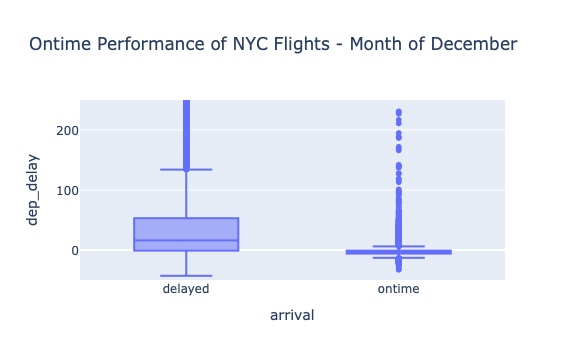

In [197]:
my_categories = ['EWR','LGA','JFK']

fig = px.box(
    DF2, 
    x='arrival',
    y='dep_delay',
    range_y=[-50, 250],
    color_discrete_map={'PHL':'#2ca25f','RDU':'#e5f5f9'},
    title='Ontime Performance of NYC Flights - Month of December'
    # points='all'
)

fig.show()

7

I think the point of the plot is to show the distribution of departure delays and quickly representing its medians, spread, skewness, and outliers. It was to show how ontime the flights of NYC locations were throughout the month of December. the delayed box plots are more spread out because depending on how delayed they actually were.

Sorry I'm not a data scientist I am really curious who actually was able to recreate this because if they did they deserve a PHD. 

In [209]:
DF2['carrier'].value_counts().head(4)

carrier
UA    58665
B6    54635
EV    54173
DL    48110
Name: count, dtype: int64

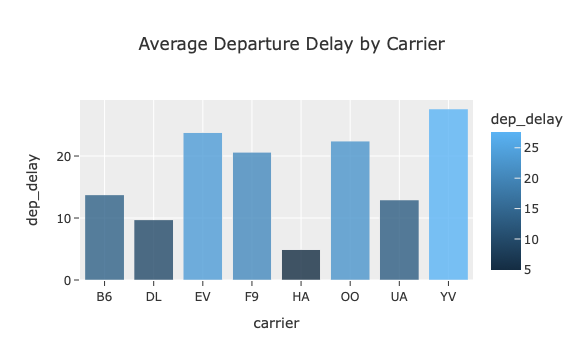

In [237]:
# 8

my_categories = ['UA','B6','EV','DL''F9','YV','HA','OO']

fig = px.bar(DF2[DF2['carrier'].isin(['UA','B6','EV','DL','F9','YV','HA','OO'])].groupby('carrier', as_index=False)['dep_delay'].mean(),
             x='carrier',
             y='dep_delay',
             color='dep_delay',
             opacity=(.8),
             color_discrete_sequence=px.colors.qualitative.Safe,
             title='Average Departure Delay by Carrier',
             template='ggplot2',
            )
fig.show()

In [233]:
DF2['carrier'].value_counts().tail(4)

carrier
F9    685
YV    601
HA    342
OO     32
Name: count, dtype: int64

8

I created a visual representation of the average departure delays from the 4 carriers with the most flights departing and the 4 carriers with the least flights departing, to see if there was a correlation of delay and flight popularity between the two groups.

By looking at the graph, I can eyeball that the four most departing flights group has a lower average of delayed departures than the group with the four least departing flights. Perhaps the reason that the four carriers with the most departing flights has as many as they do is because they are the most efficient on time carriers, and therefore the most popularly flown.